# Carga de nuestros datos

In [1]:
!pip install gdown
!gdown https://drive.google.com/uc?id=1hrHgANwgC8VyXLhXgxLYHTrILpeJ5bLl
!unzip /content/mars_and_moon.zip

Downloading...
From: https://drive.google.com/uc?id=1hrHgANwgC8VyXLhXgxLYHTrILpeJ5bLl
To: /content/mars_and_moon.zip
100% 77.6M/77.6M [00:00<00:00, 245MB/s]
Archive:  /content/mars_and_moon.zip
  inflating: best.pt                 
  inflating: craters/test/images/010_png.rf.fcf5e274562ee69a325f9d7a0b30767f.jpg  
  inflating: craters/test/images/015_png.rf.7d5b2091b6339c9480a171a59c52c3b9.jpg  
  inflating: craters/test/images/019_png.rf.1930cd277f9bf0e3fa57f2dcfee0385f.jpg  
  inflating: craters/test/images/04_png.rf.81a7d6cbeb9dc09e5a8ecd40e185fc92.jpg  
  inflating: craters/test/images/mars_crater--100-_jpg.rf.a2ad5867efb2d73e86d9d980ca40a9fe.jpg  
  inflating: craters/test/images/mars_crater--108-_jpg.rf.9395f473f249e064dbfea078e2519a17.jpg  
  inflating: craters/test/images/mars_crater--116-_jpg.rf.2e550a693a8800808e68848484716b95.jpg  
  inflating: craters/test/images/mars_crater--117-_jpg.rf.b412b6593d102c5f9dda7bce79bb815c.jpg  
  inflating: craters/test/images/mars_crater--12-

In [2]:
# Download TorchVision repo to use some files from
# references/detection
!git clone https://github.com/pytorch/vision.git
!cd vision
!git checkout v0.8.2

!cp ./vision/references/detection/utils.py ./
!cp ./vision/references/detection/transforms.py ./
!cp ./vision/references/detection/coco_eval.py ./
!cp ./vision/references/detection/engine.py ./
!cp ./vision/references/detection/coco_utils.py ./

!pip install cython
# Install pycocotools, the version by default in Colab
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install -U albumentations
!pip install -U opencv-python

# Crear una carpeta llamada "train"
!mkdir ./train
# Copiar las imágenes de entrenamiento a la carpeta "images"
!cp -a /content/mars_and_moon/train/images/. ./train/images/
# Copiar las imágenes de validación a la carpeta "images"
!cp -a /content/mars_and_moon/valid/images/. ./train/images/
# Copiar las etiquetas de entrenamiento a la carpeta "labels"
!cp -a /content/mars_and_moon/train/labels/. ./train/labels/
# Copiar las etiquetas de validación a la carpeta "labels"
!cp -a /content/mars_and_moon/valid/labels/. ./train/labels/

Cloning into 'vision'...
remote: Enumerating objects: 422423, done.
remote: Counting objects: 100% (2885/2885), done.
remote: Compressing objects: 100% (186/186), done.
remote: Total 422423 (delta 2713), reused 2852 (delta 2695), pack-reused 419538
Receiving objects: 100% (422423/422423), 836.32 MiB | 19.06 MiB/s, done.
Resolving deltas: 100% (391809/391809), done.
fatal: not a git repository (or any of the parent directories): .git
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-r9qyq2ld
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-r9qyq2ld
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp310-cp310-linux_x86_64.whl size=375268 sha256=cd6cdff96b82ed6a4a57969ef9e5ae1b0b0691254f0d9054e1e871608e7e8442
  Stored in directory: /tmp/pip-ephe

Hemos cambiado la ruta para la copia de datos, en lugar de los que se utilizaban, hemos puesto los que nosotros hemos cargado.

Train epoch y evaluate no van a estar disponibles para mi.

In [3]:
import os
import numpy as np
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import utils
import transforms as T
import albumentations as A
import cv2
import time
from albumentations.pytorch.transforms import ToTensorV2
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from  sklearn.model_selection import KFold
import random

En un principio no podíamos importar la mayoría de las librerías, pero al final nos funcionó (no tenemos explicación para esto)

# Dataset Class Setup
Definimos una clase llamada CraterDataset que se utiliza para cargar y preparar un conjunto de datos de detección de cráteres.

Esta clase se encarga de cargar imágenes y sus correspondientes etiquetas (si están disponibles) para su uso en tareas de detección de objetos. También se encarga de preparar los datos en el formato adecuado para su procesamiento por un modelo de detección de objetos.

In [4]:
class CraterDataset(object):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(self.root, "images"))))
        self.annots = list(sorted(os.listdir(os.path.join(self.root, "labels"))))
        self.classes = ['Background','Crater']

    # Converts boundry box formats, this version assumes single class only!
    def convert_box_cord(self,bboxs, format_from, format_to, img_shape):
        if format_from == 'normxywh':
            if format_to == 'xyminmax':
                xw = bboxs[:, (1, 3)] * img_shape[1]
                yh = bboxs[:, (2, 4)] * img_shape[0]
                xmin = xw[:, 0] - xw[:, 1] / 2
                xmax = xw[:, 0] + xw[:, 1] / 2
                ymin = yh[:, 0] - yh[:, 1] / 2
                ymax = yh[:, 0] + yh[:, 1] / 2
                coords_converted = np.column_stack((xmin, ymin, xmax, ymax))
        return coords_converted
    def __getitem__(self, idx):
        # load images and boxes
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        annot_path = os.path.join(self.root, "labels", self.annots[idx])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img= img/255.0

        # retrieve bbox list and format to required type,
        # if annotation file is empty, fill dummy box with label 0
        if os.path.getsize(annot_path) != 0:
            bboxs = np.loadtxt(annot_path, ndmin=2)
            bboxs = self.convert_box_cord(bboxs, 'normxywh', 'xyminmax', img.shape)
            num_objs = len(bboxs)
            bboxs = torch.as_tensor(bboxs, dtype=torch.float32)
            # there is only one class
            labels = torch.ones((num_objs,), dtype=torch.int64)
            # suppose all instances are not crowd
            iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        else:
            bboxs = torch.as_tensor([[0, 0, 640, 640]], dtype=torch.float32)
            labels = torch.zeros((1,), dtype=torch.int64)
            iscrowd = torch.zeros((1,), dtype=torch.int64)

        area = (bboxs[:, 3] - bboxs[:, 1]) * (bboxs[:, 2] - bboxs[:, 0])
        image_id = torch.tensor([idx])
        target = {}
        target["boxes"] = bboxs
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            sample = self.transforms(image=img,
                                     bboxes=target['boxes'],
                                     labels=labels)
        img = sample['image']
        target['boxes'] = torch.tensor(sample['bboxes'])
        target['labels'] = torch.tensor(sample['labels'])
        if target['boxes'].ndim == 1:
            target['boxes'] = torch.as_tensor([[0, 0, 640, 640]], dtype=torch.float32)
            target['labels'] = torch.zeros((1,), dtype=torch.int64)
        return img, target

    def __len__(self):
        return len(self.imgs)

# Model configuration

Estamos creando el modelo para detectar objetos usando el método faster RCNN.

In [5]:
def get_model_bbox(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [6]:
def get_transform(train):
    if train:
        return A.Compose([
            # A.Flip(p=0.5),
            # A.RandomResizedCrop(height=640,width=640,p=0.4),
            # # A.Perspective(p=0.4),
            # A.Rotate(p=0.5),
            # # A.Transpose(p=0.3),
            ToTensorV2(p=1.0)],
            bbox_params=A.BboxParams(format='pascal_voc',min_visibility=0.4, label_fields=['labels']))
    else:
        return A.Compose([ToTensorV2(p=1.0)],
                         bbox_params=A.BboxParams(format='pascal_voc', min_visibility=0.5, label_fields=['labels']))

In [7]:
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
    if hasattr(layer, 'reset_parameters'):
        print(f'Reset trainable parameters of layer = {layer}')
        layer.reset_parameters()

In [8]:
# Function to visualize bounding boxes in the image
def plot_img_bbox(img, target):
    # plot the image and bboxes
    # Bounding boxes are defined as follows: x-min y-min width height
    fig, a = plt.subplots(1, 1)
    fig.set_size_inches(5, 5)
    a.imshow(img.permute((1,2,0)))
    for box in (target['boxes']):
        x, y, width, height = box[0], box[1], box[2] - box[0], box[3] - box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 edgecolor='b',
                                 facecolor='none',
                                 clip_on=False)
        a.annotate('Crater', (x,y-20), color='blue', weight='bold',
                   fontsize=10, ha='left', va='top')

        # Draw the bounding box on top of the image
        a.add_patch(rect)
    plt.show()

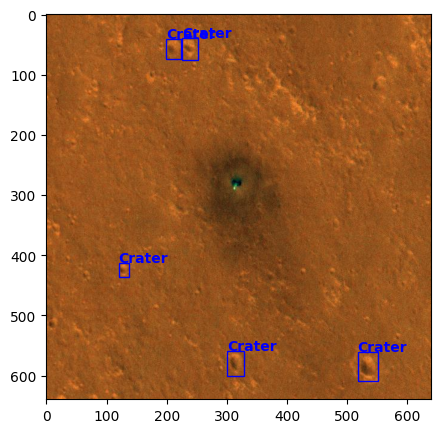

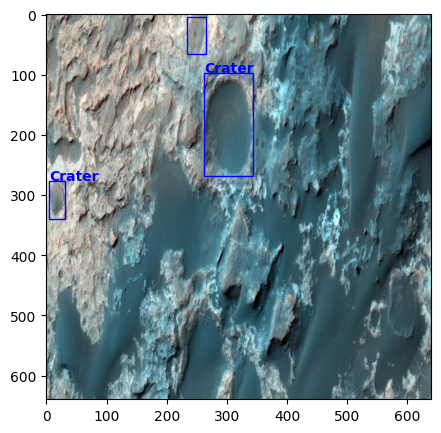

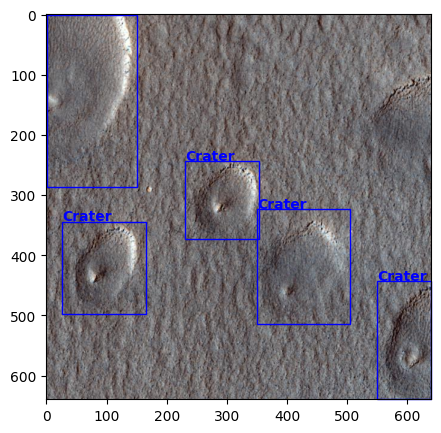

In [9]:
dataset = CraterDataset('/content/craters/train', get_transform(train=True))
# Prints an example of image with annotations
for i in random.sample(range(1, 100), 3):
    img, target = dataset[i]
    plot_img_bbox(img, target)

Creamos instancias de la clase CraterDataset y utilizamos imágenes y etiquetas del conjunto de entrenamiento para mostrar ejemplos de imágenes con cajas delimitadoras dibujadas.

# K-fold cross validation

In [11]:
from engine import train_one_epoch

In [12]:
# train on the GPU or on the CPU, if a GPU is not available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
k_folds = 2
num_epochs = 2


# our dataset has two classes only - background and crater
num_classes = 2
# use our dataset and defined transformations
dataset = CraterDataset('/content/craters/train', get_transform(train=True))
dataset_val = CraterDataset('/content/craters/train', get_transform(train=False))

# Define the K-fold Cross Validator
kfold = KFold(n_splits=k_folds, shuffle=True)

# Start print
print('--------------------------------')

# K-fold Cross Validation model evaluation
for fold, (train_ids, val_ids) in enumerate(kfold.split(dataset)):
    print(f'FOLD {fold}')
    print('--------------------------------')

    dataset_subset = torch.utils.data.Subset(dataset, list(train_ids))
    dataset_val_subset = torch.utils.data.Subset(dataset_val, list(val_ids))

    # define training and validation data loaders
    data_loader = torch.utils.data.DataLoader(
            dataset_subset, batch_size=8, shuffle=True, num_workers=2,
        collate_fn=utils.collate_fn)

    data_loader_val = torch.utils.data.DataLoader(
        dataset_val_subset, batch_size=1, shuffle=False, num_workers=2,
        collate_fn=utils.collate_fn)

    # get the model using our helper function
    model = get_model_bbox(num_classes)

    #model.apply(reset_weights) # Check if beneficial

    # move model to the right device
    model.to(device)

    # construct an optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005,  # Check if beneficial
                                momentum=0.9, weight_decay=0)

    # and a learning rate scheduler
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                    step_size=10,
                                                    gamma=0.1)

    # let's train!
    for epoch in range(num_epochs):


        # train for one epoch, printing every 50 iterations
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50)
        # update the learning rate
        lr_scheduler.step()
        # evaluate on the test dataset
    #evaluate(model, data_loader_val, device=device)

--------------------------------
FOLD 0
--------------------------------
Epoch: [0]  [0/7]  eta: 0:01:13  lr: 0.000838  loss: 2.0141 (2.0141)  loss_classifier: 0.5432 (0.5432)  loss_box_reg: 0.3084 (0.3084)  loss_objectness: 1.1210 (1.1210)  loss_rpn_box_reg: 0.0416 (0.0416)  time: 10.4905  data: 0.3650  max mem: 7205
Epoch: [0]  [6/7]  eta: 0:00:02  lr: 0.005000  loss: 1.1320 (1.1492)  loss_classifier: 0.3858 (0.3672)  loss_box_reg: 0.3084 (0.2892)  loss_objectness: 0.3713 (0.4598)  loss_rpn_box_reg: 0.0363 (0.0330)  time: 2.5270  data: 0.0757  max mem: 7364
Epoch: [0] Total time: 0:00:17 (2.5353 s / it)
Epoch: [1]  [0/7]  eta: 0:00:12  lr: 0.005000  loss: 0.8570 (0.8570)  loss_classifier: 0.3683 (0.3683)  loss_box_reg: 0.2527 (0.2527)  loss_objectness: 0.2194 (0.2194)  loss_rpn_box_reg: 0.0167 (0.0167)  time: 1.7410  data: 0.3501  max mem: 7364
Epoch: [1]  [6/7]  eta: 0:00:01  lr: 0.005000  loss: 0.8570 (0.8105)  loss_classifier: 0.2869 (0.3324)  loss_box_reg: 0.2858 (0.3133)  loss_o

Implementamos la validación cruzada k-fold para entrenar el modelo. Se divide el conjunto de datos en pliegues, entrena el modelo en cada pliegue y evaluamos su rendimiento.

In [13]:
from sklearn.model_selection import KFold

# Crear una instancia de KFold
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Obtener las imágenes y las anotaciones de tu conjunto de datos
all_samples = list(range(len(dataset.imgs)))  # Aquí utilizamos len(dataset.imgs) para obtener la cantidad de imágenes.

# Realizar la validación cruzada
for fold, (train_ids, val_ids) in enumerate(kfold.split(all_samples)):
    # train_ids y val_ids son los índices de las muestras en cada conjunto
    print(f'FOLD {fold}')
    print('--------------------------------')

    # Utiliza los índices train_ids y val_ids para dividir tus datos de entrenamiento y prueba
    train_data = [all_samples[i] for i in train_ids]
    val_data = [all_samples[i] for i in val_ids]

    # Entrena y evalúa tu modelo utilizando train_data y val_data

FOLD 0
--------------------------------
FOLD 1
--------------------------------
FOLD 2
--------------------------------
FOLD 3
--------------------------------
FOLD 4
--------------------------------


Entrenamos un modelo en cada pliegue del conjunto de datos. Esto es útil para evaluar el rendimiento del modelo en diferentes particiones del conjunto de datos y garantizar que el modelo sea robusto en diferentes conjuntos de datos de prueba.

In [14]:
# Train on the GPU or on the CPU, if a GPU is not available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
k_folds = 5
num_epochs = 50

# Our dataset has two classes only - background and crater
num_classes = 2

# Use our dataset and defined transformations
dataset = CraterDataset('/content/craters/train', get_transform(train=True))

# Define the K-fold Cross Validator
kfold = KFold(n_splits=k_folds, shuffle=True)

# Start print
print('--------------------------------')

# K-fold Cross Validation model evaluation
for fold, (train_ids, val_ids) in enumerate(kfold.split(range(len(dataset.imgs)))):
    print(f'FOLD {fold}')
    print('--------------------------------')
    dataset_subset = torch.utils.data.Subset(dataset, list(train_ids))
    dataset_val_subset = torch.utils.data.Subset(dataset, list(val_ids))  # Use the same validation set for each fold

    # Define training and validation data loaders
    data_loader = torch.utils.data.DataLoader(
        dataset_subset, batch_size=8, shuffle=True, num_workers=2,
        collate_fn=utils.collate_fn)

    data_loader_val = torch.utils.data.DataLoader(
        dataset_val_subset, batch_size=1, shuffle=False, num_workers=2,
        collate_fn=utils.collate_fn)

    # Get the model using our helper function
    model = get_model_bbox(num_classes)

    # Model-specific modifications and training can be added here

    # Move model to the right device
    model.to(device)

    # Construct an optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0)

    # The training and evaluation loop for each fold can be added here

    # Example:
    for epoch in range(num_epochs):
        for images, targets in data_loader:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Training steps here

        # Validation steps here

--------------------------------
FOLD 0
--------------------------------
FOLD 1
--------------------------------
FOLD 2
--------------------------------
FOLD 3
--------------------------------
FOLD 4
--------------------------------


Si se establece el número de épocas en 50, significa que el modelo se entrenará durante 50 iteraciones completas a través de todo el conjunto de datos de entrenamiento. Cada época implica que el modelo verá todos los ejemplos de entrenamiento una vez, lo que le permite ajustar sus parámetros en función de la información contenida en los datos.

# Final training and evaluation

In [16]:
from engine import train_one_epoch
num_epochs = 25

# our dataset has two classes only - background and crater
num_classes = 2
# use our dataset and defined transformations
dataset = CraterDataset('/content/craters/train', get_transform(train=True))
dataset_test = CraterDataset('/content/craters/test', get_transform(train=False))

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
        dataset, batch_size=8, shuffle=True, num_workers=2,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=2,
    collate_fn=utils.collate_fn)

# get the model using our helper function
model = get_model_bbox(num_classes)

'''
Use this to reset all trainable weights
model.apply(reset_weights)
'''

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,  # Feel free to play with values
                            momentum=0.9, weight_decay=0)

# Defining learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                step_size=20,
                                                gamma=0.2)


result_mAP = []
best_epoch = None

# Let's train!
for epoch in range(num_epochs):


    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50)
    # update the learning rate
    lr_scheduler.step()

# Saving the last model
save_path = os.path.join(f'Crater_noaug_sgd_2batch-lastepoch{num_epochs-1}.pth')
torch.save(model.state_dict(), save_path)
print(f'model from last epoch(no.{num_epochs-1}) saved')

Epoch: [0]  [ 0/13]  eta: 0:00:28  lr: 0.000421  loss: 1.7252 (1.7252)  loss_classifier: 0.7604 (0.7604)  loss_box_reg: 0.2778 (0.2778)  loss_objectness: 0.6541 (0.6541)  loss_rpn_box_reg: 0.0330 (0.0330)  time: 2.2252  data: 0.6219  max mem: 7718
Epoch: [0]  [12/13]  eta: 0:00:01  lr: 0.005000  loss: 1.0925 (1.1368)  loss_classifier: 0.4408 (0.4440)  loss_box_reg: 0.3588 (0.3243)  loss_objectness: 0.1850 (0.3147)  loss_rpn_box_reg: 0.0427 (0.0537)  time: 1.4599  data: 0.0780  max mem: 7875
Epoch: [0] Total time: 0:00:19 (1.4701 s / it)
Epoch: [1]  [ 0/13]  eta: 0:00:28  lr: 0.005000  loss: 0.7880 (0.7880)  loss_classifier: 0.2729 (0.2729)  loss_box_reg: 0.4192 (0.4192)  loss_objectness: 0.0608 (0.0608)  loss_rpn_box_reg: 0.0352 (0.0352)  time: 2.1588  data: 0.6197  max mem: 7875
Epoch: [1]  [12/13]  eta: 0:00:01  lr: 0.005000  loss: 0.6080 (0.6615)  loss_classifier: 0.2013 (0.2129)  loss_box_reg: 0.3300 (0.3251)  loss_objectness: 0.0608 (0.0780)  loss_rpn_box_reg: 0.0347 (0.0455)  tim

In [19]:
dataset_test = CraterDataset('/content/craters/test', get_transform(train=False))

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=2,
    collate_fn=utils.collate_fn)

model = get_model_bbox(num_classes)

# load model to evaluate
model.load_state_dict(torch.load(os.path.join(f'Crater_noaug_sgd_2batch-lastepoch{num_epochs-1}.pth'),map_location=device))
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [20]:
# Define colors for bounding boxes
color_inference = np.array([0.0,0.0,255.0])
color_label = np.array([255.0,0.0,0.0])

# Score value thershold for displaying predictions
detection_threshold = 0.7
# to count the total number of images iterated through
frame_count = 0
# to keep adding the FPS for each image
total_fps = 0

!mkdir ./results

Configuramos las opciones de visualización, incluyendo colores de cuadros delimitadores, umbrales de confianza y la creación de un directorio para almacenar resultados.

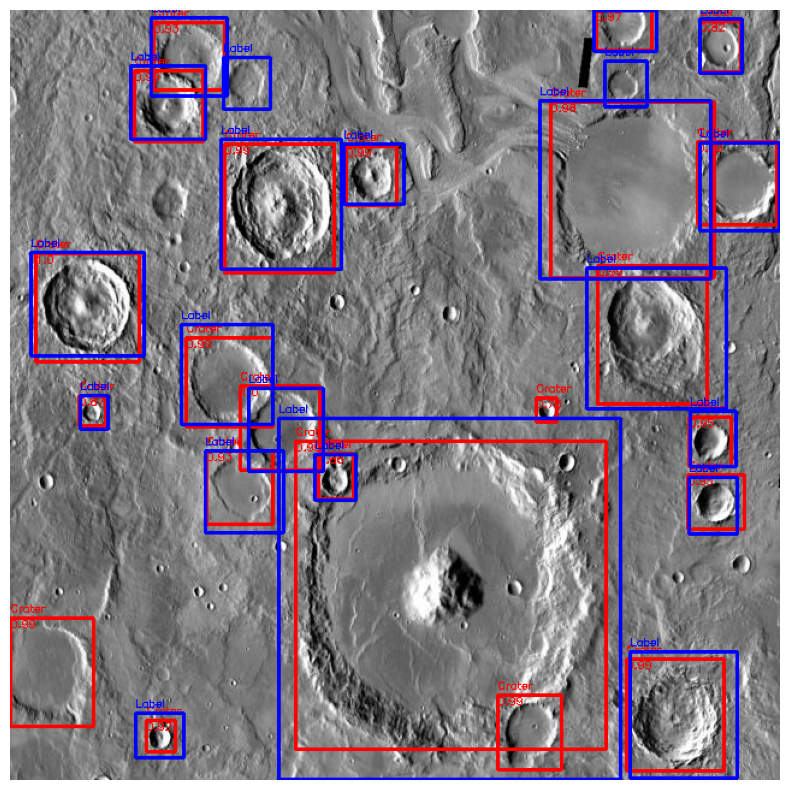

Image 1 done...
--------------------------------------------------


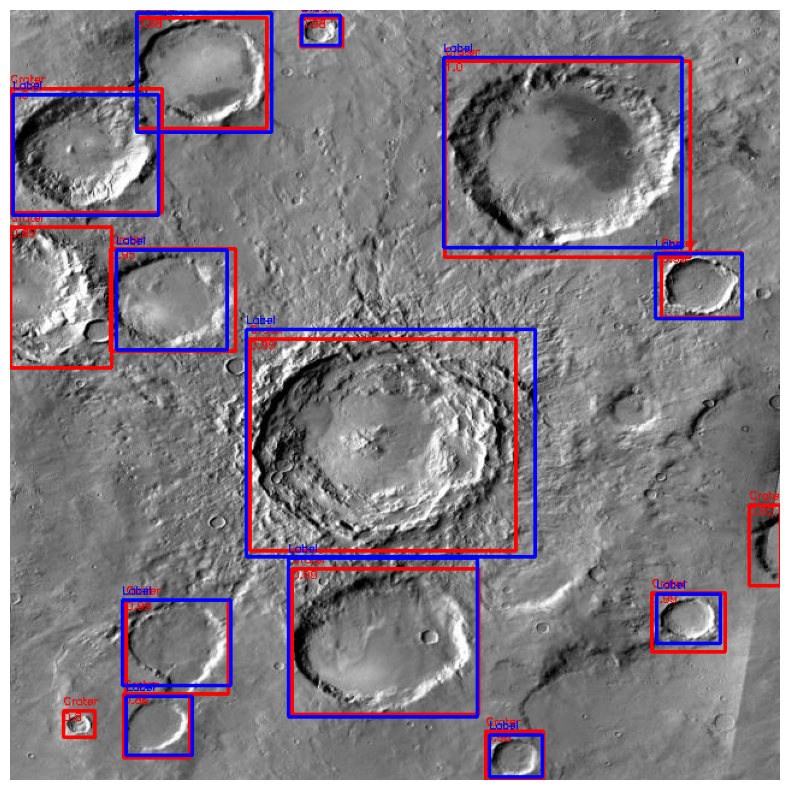

Image 2 done...
--------------------------------------------------


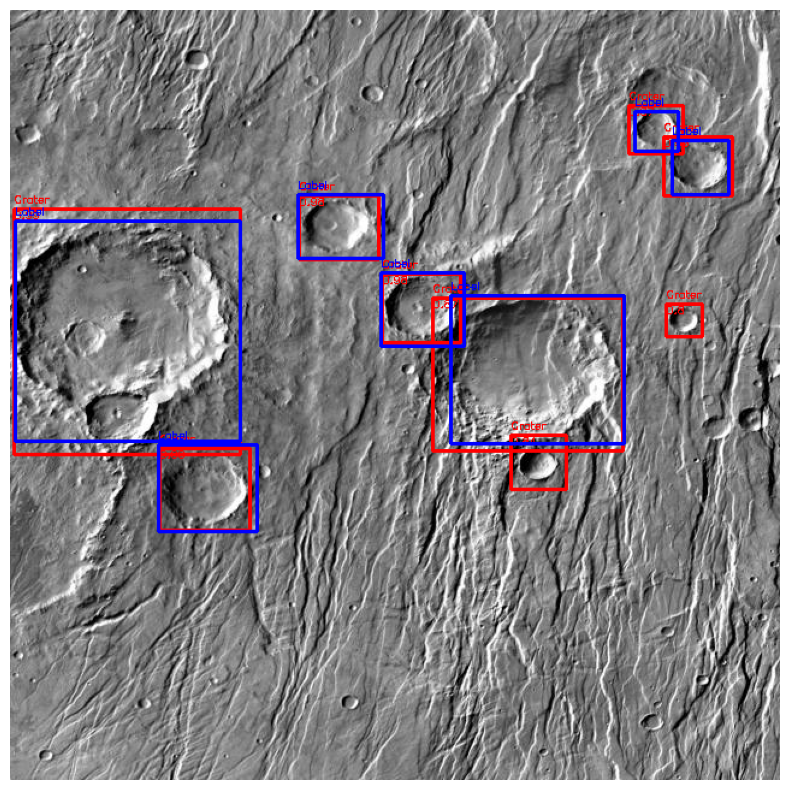

Image 3 done...
--------------------------------------------------


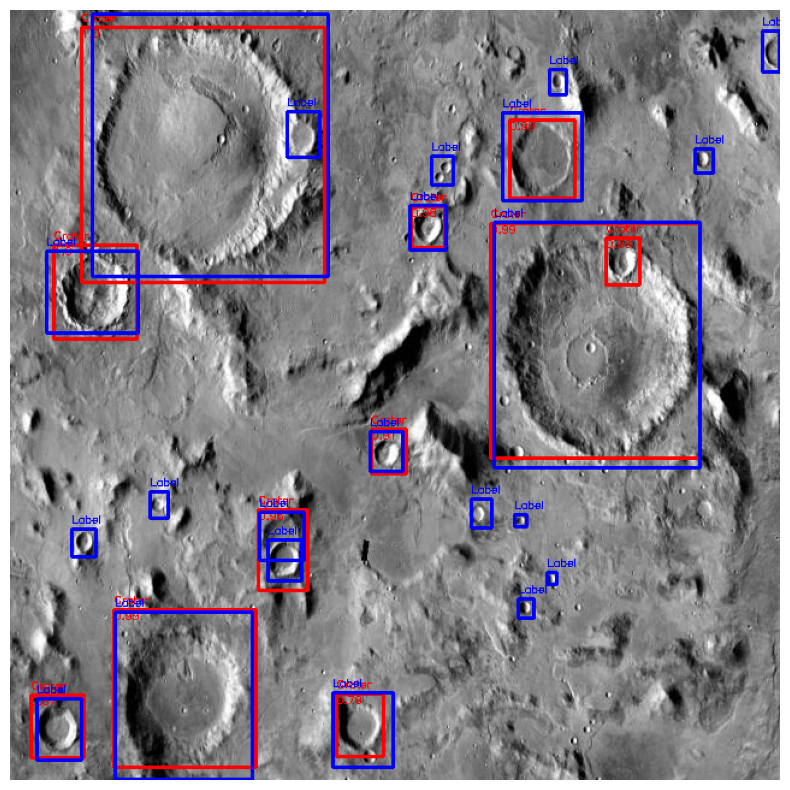

Image 4 done...
--------------------------------------------------


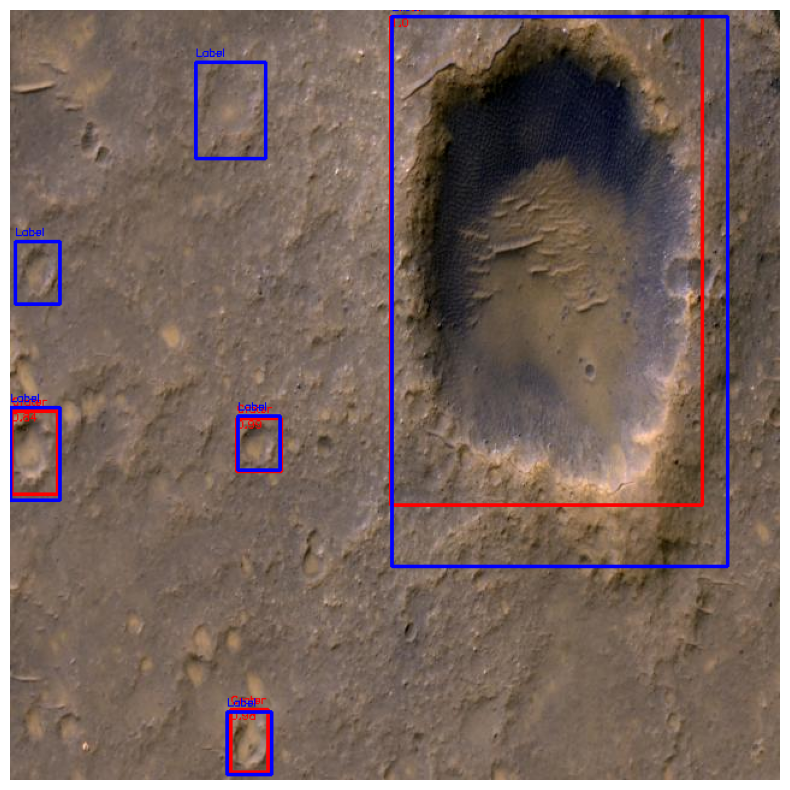

Image 5 done...
--------------------------------------------------


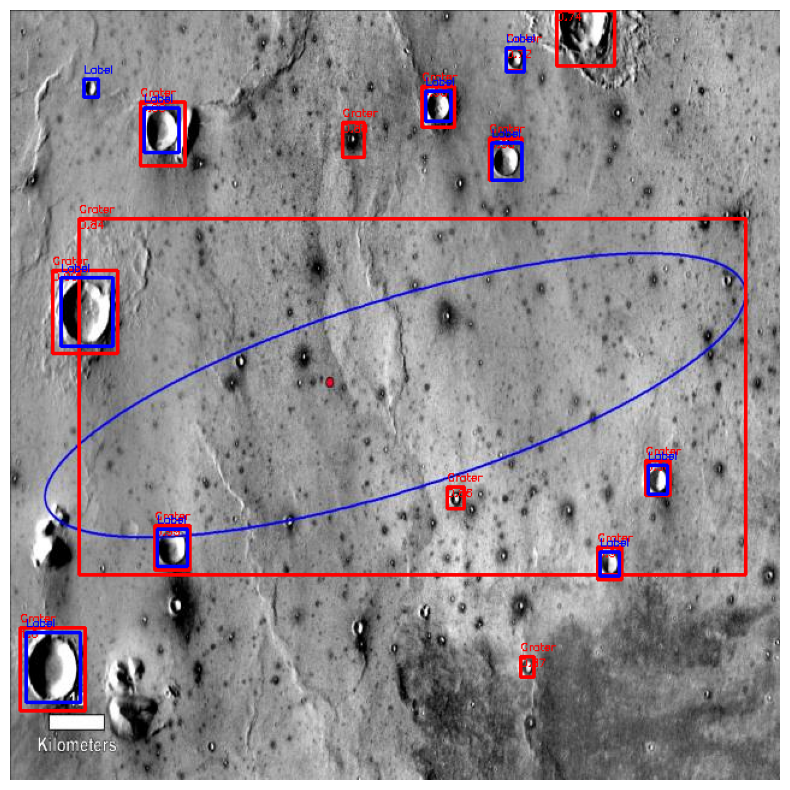

Image 6 done...
--------------------------------------------------


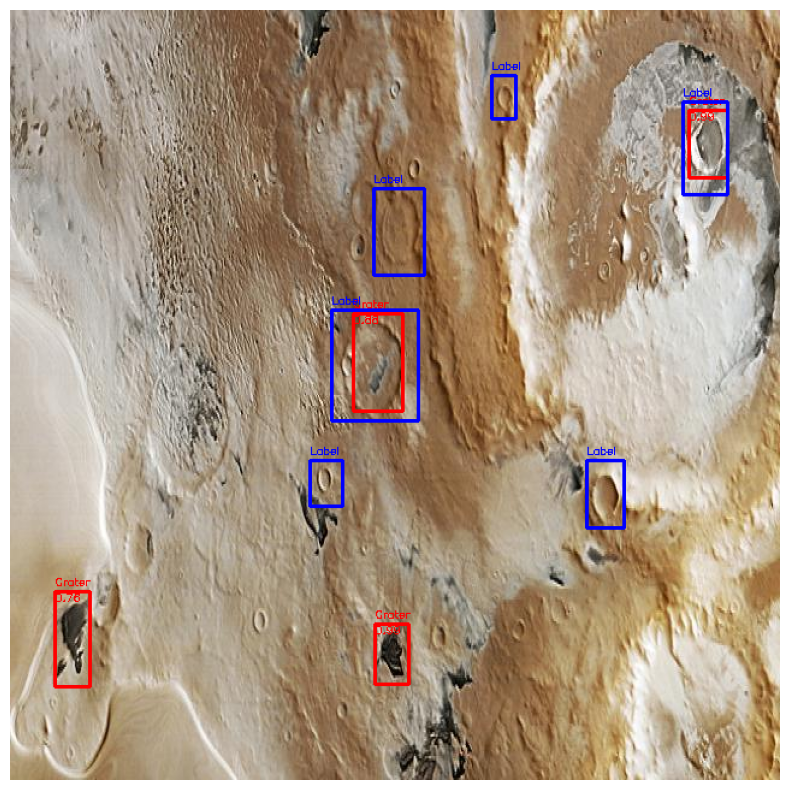

Image 7 done...
--------------------------------------------------


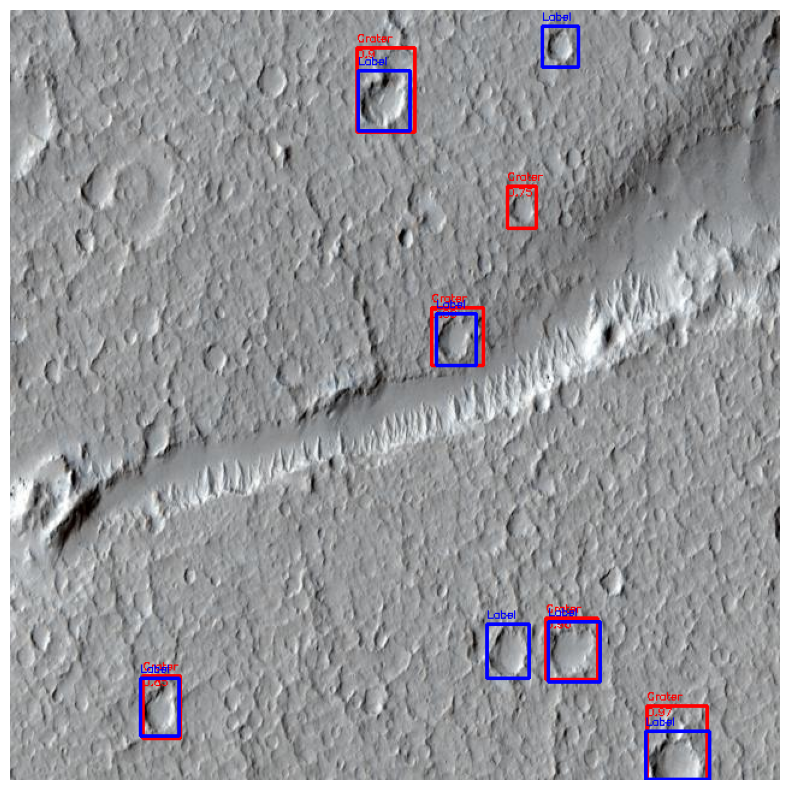

Image 8 done...
--------------------------------------------------


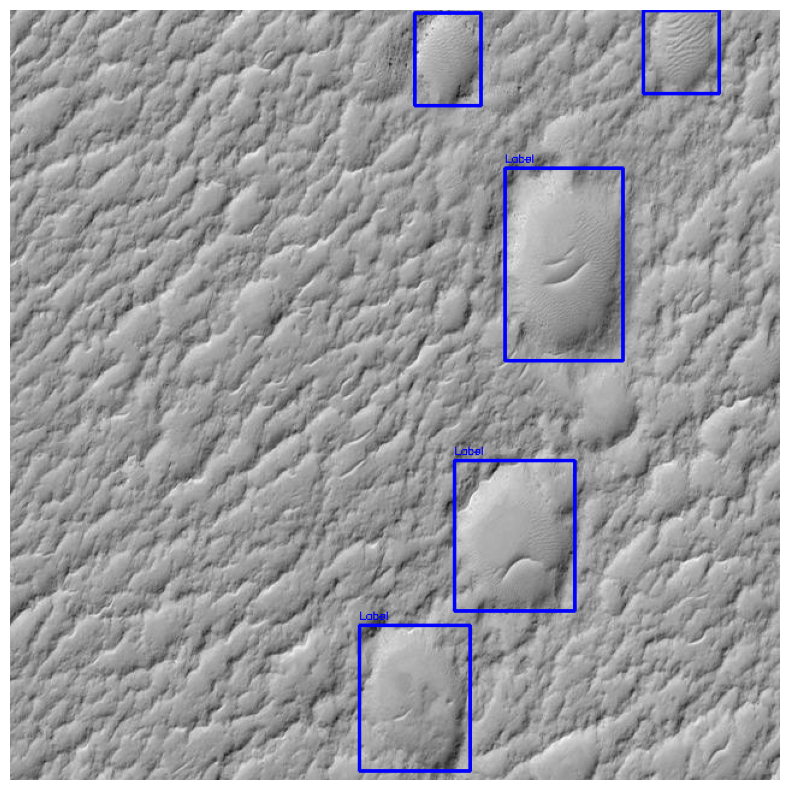

Image 9 done...
--------------------------------------------------


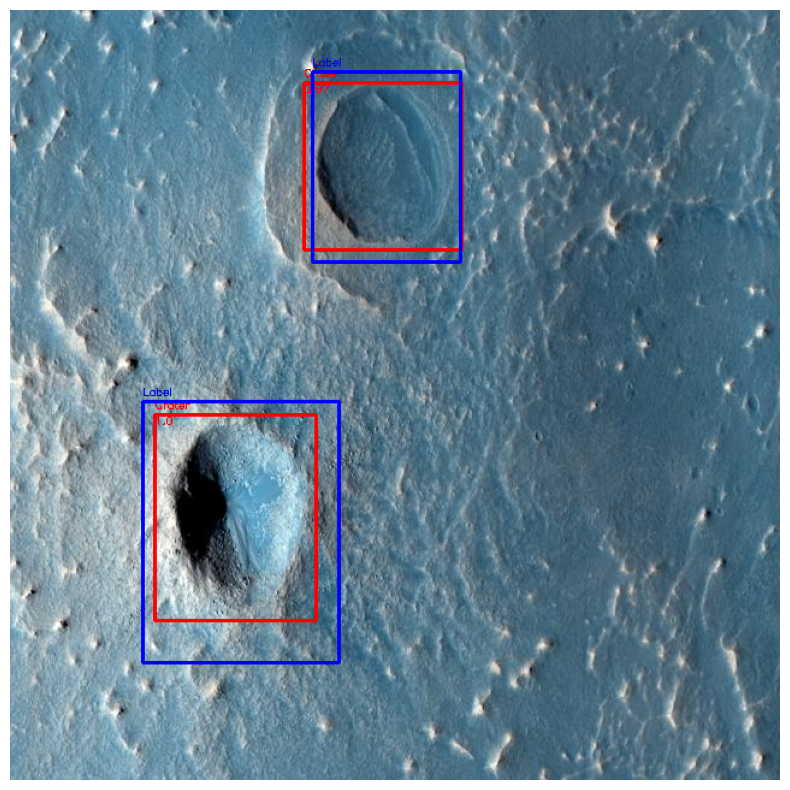

Image 10 done...
--------------------------------------------------


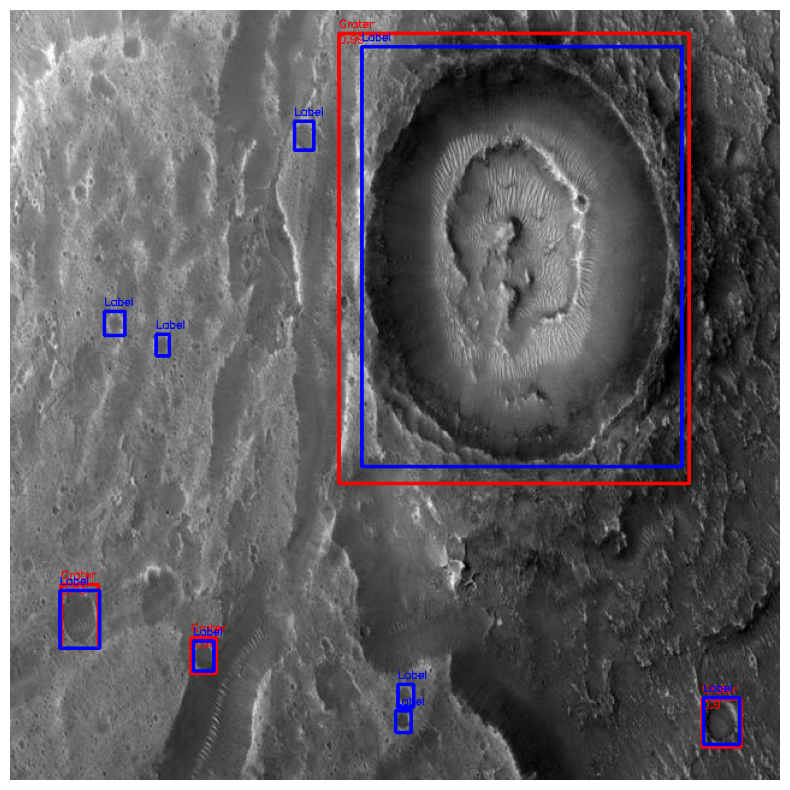

Image 11 done...
--------------------------------------------------


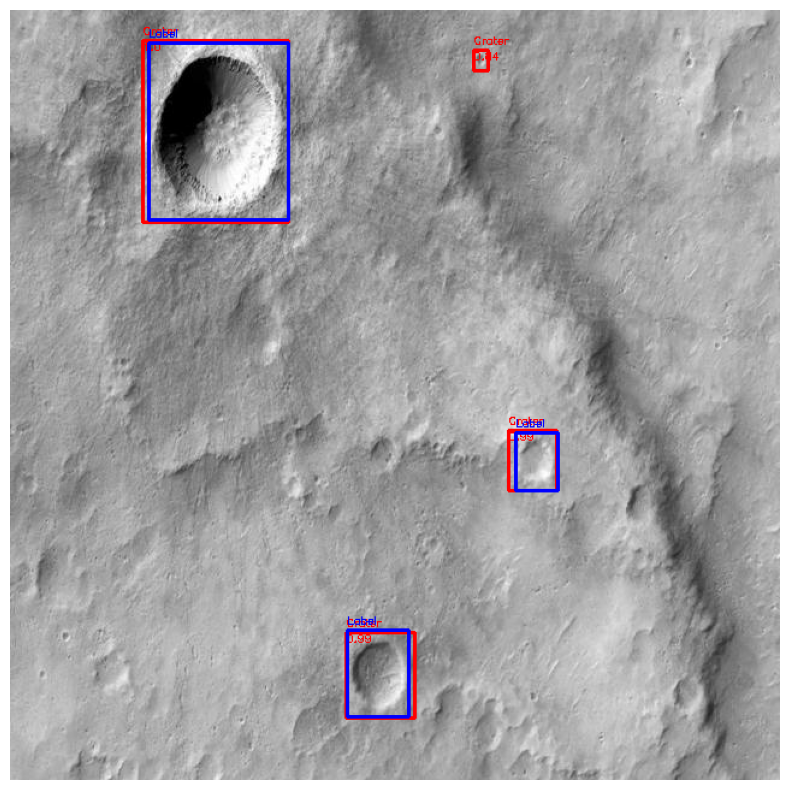

Image 12 done...
--------------------------------------------------


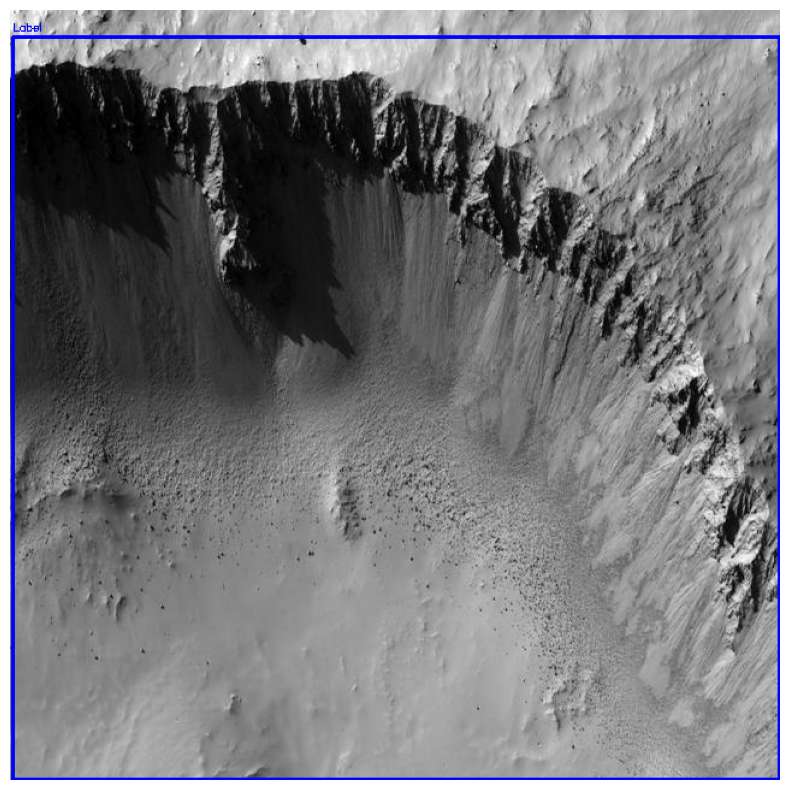

Image 13 done...
--------------------------------------------------


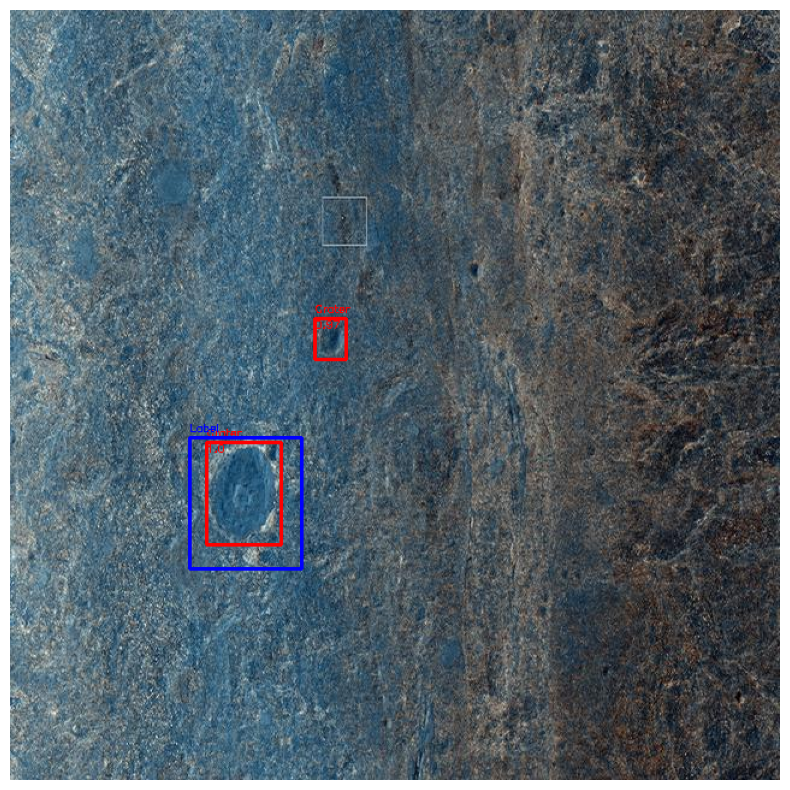

Image 14 done...
--------------------------------------------------


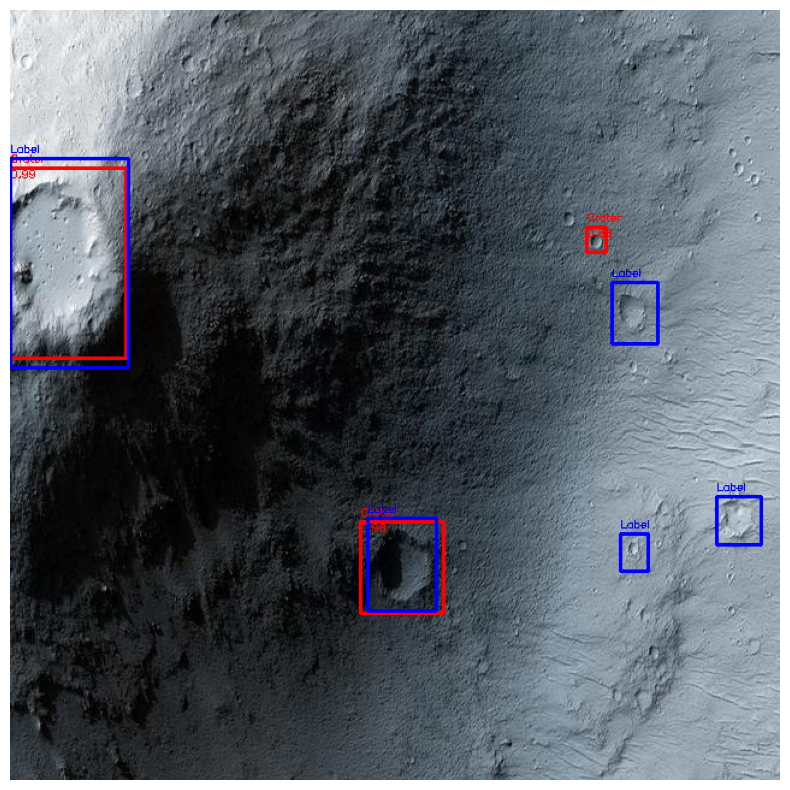

Image 15 done...
--------------------------------------------------


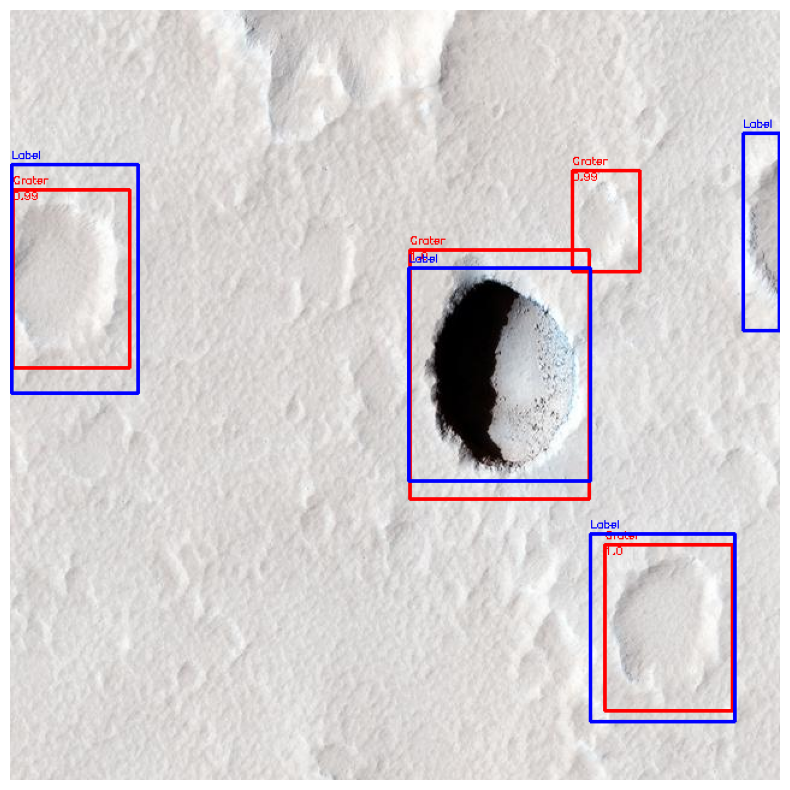

Image 16 done...
--------------------------------------------------


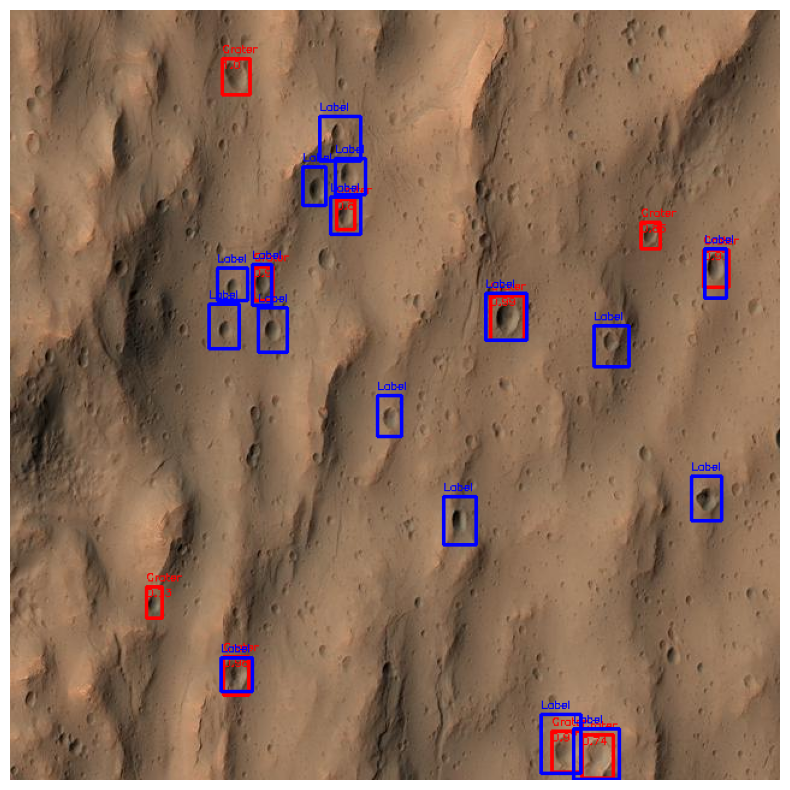

Image 17 done...
--------------------------------------------------


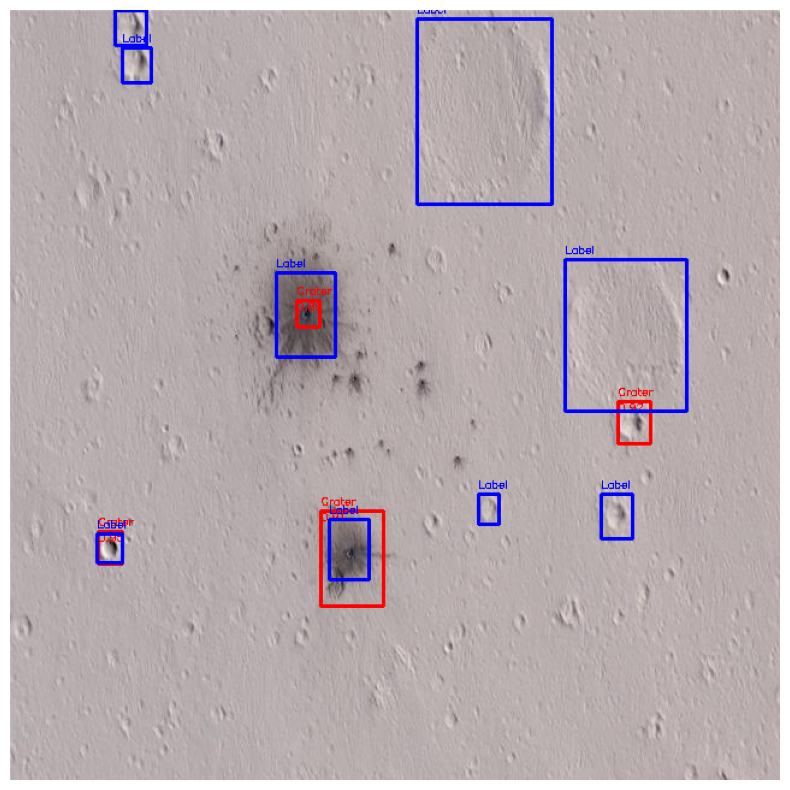

Image 18 done...
--------------------------------------------------


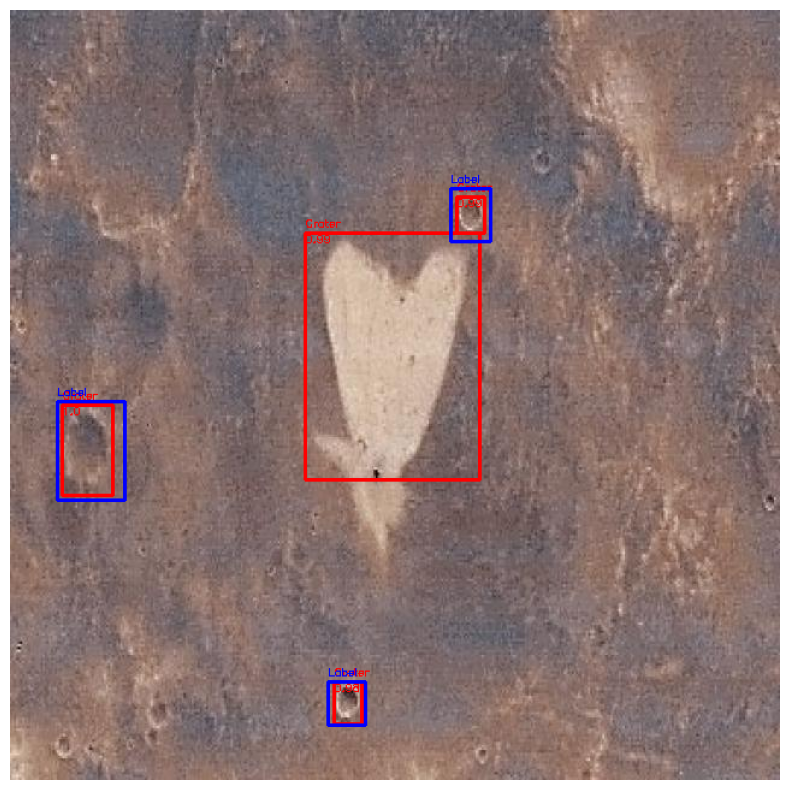

Image 19 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 9.600


In [22]:
# Configura el modelo en modo de evaluación (prueba)
model.eval()
for i,data in enumerate(data_loader_test):
    # get the image file name for predictions file name
    image_name = 'image no:' + str(int(data[1][0]['image_id']))
    model_image = data[0][0]
    cv2_image = np.transpose(model_image.numpy()*255,(1, 2, 0)).astype(np.float32)
    cv2_image = cv2.cvtColor(cv2_image, cv2.COLOR_RGB2BGR).astype(np.float32)

    # add batch dimension
    model_image = torch.unsqueeze(model_image, 0)
    start_time = time.time()
    with torch.no_grad():
        outputs = model(model_image.to(device))
    end_time = time.time()
    # get the current fps
    fps = 1 / (end_time - start_time)
    # add `fps` to `total_fps`
    total_fps += fps
    # increment frame count
    frame_count += 1
    # load all detection to CPU for further operations
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    # carry further only if there's detected boxes
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        # filter out boxes according to `detection_threshold`
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        scores = np.round(scores[scores >= detection_threshold],2)
        draw_boxes = boxes.copy()


        # draw the bounding boxes and write the class name on top of it
        for j,box in enumerate(draw_boxes):
            cv2.rectangle(cv2_image,
                          (int(box[0]), int(box[1])),
                          (int(box[2]), int(box[3])),
                          color_inference, 2)
            cv2.putText(img=cv2_image, text="Crater",
                        org=(int(box[0]), int(box[1] - 5)),
                        fontFace=cv2.FONT_HERSHEY_SIMPLEX,fontScale= 0.3,color= color_inference,
                        thickness=1, lineType=cv2.LINE_AA)
            cv2.putText(img=cv2_image, text=str(scores[j]),
                        org=(int(box[0]), int(box[1] + 8)),
                        fontFace=cv2.FONT_HERSHEY_SIMPLEX,fontScale= 0.3,color= color_inference,
                        thickness=1, lineType=cv2.LINE_AA)

        # add boxes for labels
        for box in data[1][0]['boxes']:
            cv2.rectangle(cv2_image,
                          (int(box[0]), int(box[1])),
                          (int(box[2]), int(box[3])),
                          color_label, 2)
            cv2.putText(img=cv2_image, text="Label",
                        org=(int(box[0]), int(box[1] - 5)),
                        fontFace=cv2.FONT_HERSHEY_SIMPLEX,fontScale= 0.3,color= color_label,
                        thickness=1, lineType=cv2.LINE_AA)


        # set size
        plt.figure(figsize=(10,10))
        plt.axis("off")

        # convert color from CV2 BGR back to RGB
        plt_image = cv2.cvtColor(cv2_image/255.0, cv2.COLOR_BGR2RGB)
        plt.imshow(plt_image)
        plt.show()
        cv2.imwrite(f"./results/{image_name}.jpg", cv2_image)
    print(f"Image {i + 1} done...")
    print('-' * 50)
print('TEST PREDICTIONS COMPLETE')

avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Hemos añadido el código model.eval() se utiliza para poner el modelo en modo de evaluación o prueba. Cuando un modelo de detección de objetos se encuentra en modo de evaluación, significa que no se está entrenando, sino que se está utilizando para hacer predicciones en datos de prueba o validación

MODIFICACIÓN DEL MODELO: RETINANET PRIMER INTENTO

RetinaNet con ResNet-50 o ResNet-101:es una buena opción para detección de objetos y ha demostrado ser efectivo.

In [40]:
def get_retinanet_model_bbox(num_classes):
    model = retinanet_resnet50_fpn(pretrained=False)  # No utilizar pretrained para entrenar desde cero
    in_features = model.head.classification_head.conv[0].in_channels
    model.head.classification_head.num_classes = num_classes
    model.head.classification_head.cls_logits = nn.Conv2d(in_features, num_classes, 3, 1, 1)
    model.head.classification_head.cls_score = nn.Linear(in_features, num_classes)
    return model

In [42]:
import torch
import torch.nn as nn

In [43]:
import torch.optim as optim

# Define la función de pérdida
criterion = nn.SmoothL1Loss()

# Define el optimizador
optimizer = optim.Adam(retinanet_model.parameters(), lr=0.001)

Primero, necesitas definir un Dataset personalizado para cargar tus datos. Aquí tienes un ejemplo de cómo hacerlo utilizando tu estructura de datos:

In [46]:
import os
import cv2
import numpy as np
import torch
from torchvision.transforms import functional as F
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, image_dir, label_dir, transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.transform = transform
        self.images = os.listdir(image_dir)
        self.labels = os.listdir(label_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.images[idx])
        label_name = os.path.join(self.label_dir, self.labels[idx])

        image = cv2.imread(img_name)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image = image / 255.0

        # Carga y procesa las etiquetas según sea necesario
        # Puedes adaptar este proceso para tu formato de etiquetas

        # Aplicar transformaciones si están definidas
        if self.transform:
            image = self.transform(image)

        return image, labels  # Ajusta las etiquetas según tu formato


In [48]:
import os

# Obtén la ruta absoluta del directorio actual
current_directory = os.path.abspath(os.getcwd())

# Define el nombre de la carpeta de etiquetas (label_dir)
label_dir = 'train/labels'

# Combina la ruta absoluta del directorio actual con label_dir para encontrar su ubicación
label_directory = os.path.join(current_directory, label_dir)

# Imprime la ubicación de label_dir
print(f"La ubicación de label_dir es: {label_directory}")


La ubicación de label_dir es: /content/train/labels


crear un DataLoader a partir de tu CustomDataset

In [50]:
from torch.utils.data import DataLoader
from torchvision import transforms

# Define las transformaciones que desees aplicar a tus imágenes
transform = transforms.Compose([
    transforms.ToTensor(),
    # Otras transformaciones si es necesario
])

# Crea el Dataset personalizado
train_dataset = CustomDataset(image_dir='/content/craters/train', label_dir='/content/craters/train/labels', transform=transform)

# Crea un DataLoader para cargar los datos de entrenamiento
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [51]:
retinanet_model = get_model_retinanet(num_classes=2)  # 2 clases: fondo y cráteres
criterion = torchvision.models.detection.retinanet_loss
optimizer = torch.optim.Adam(retinanet_model.parameters(), lr=0.001)


AttributeError: ignored

In [58]:
from yolov5 import YOLOv5 # Asegúrate de importar correctamente desde yolov5

# Reemplaza 'model_path' con la ruta al modelo preentrenado que deseas utilizar
model_path = 'ruta_al_modelo_preentrenado.pt'

# Crea una instancia del modelo YOLOv5
model = YOLOv5(model_path)

!pip install yolov5
import torch
import cv2
import numpy as np
from torchvision import transforms
from yolov5 import YOLOv5 # Reemplaza 'yolov3' con la implementación de YOLO que estás utilizando

# Carga el modelo YOLO preentrenado
model = YOLOv5() # Reemplaza 'YOLOv3' con la clase correcta de tu implementación

# Carga la imagen
image = cv2.imread('/content/craters/test/images/010_png.rf.fcf5e274562ee69a325f9d7a0b30767f.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = transforms.ToTensor()(image).unsqueeze(0)

# Realiza la inferencia
with torch.no_grad():
    predictions = model(image)

# Dibuja las bounding boxes en la imagen
for prediction in predictions:
    for bbox in prediction:
        x, y, w, h, conf, class_prob = bbox
        if conf > detection_threshold: # Ajusta el umbral de confianza
            x1 = int((x - w / 2) * image.shape[3])
            y1 = int((y - h / 2) * image.shape[2])
            x2 = int((x + w / 2) * image.shape[3])
            y2 = int((y + h / 2) * image.shape[2])

            # Dibuja la bounding box
            cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)

# Muestra la imagen con las bounding boxes
image = image.squeeze(0).permute(1, 2, 0).numpy()
cv2.imshow('Detected Objects', image)
cv2.waitKey(0)
cv2.destroyAllWindows()

ModuleNotFoundError: ignored

In [59]:
!git clone https://github.com/ultralytics/yolov5 # clone
!cd yolov5
!pip install -r requirements.txt # install

import torch

# Model
model = torch.hub.load("ultralytics/yolov5", "yolov5s") # or yolov5n - yolov5x6, custom

# Images
img = "https://ultralytics.com/images/zidane.jpg" # or file, Path, PIL, OpenCV, numpy, list

# Inference
results = model(img)

# Results
results.print() # or .show(), .save(), .crop(), .pandas(), etc.

Cloning into 'yolov5'...
remote: Enumerating objects: 16036, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 16036 (delta 39), reused 42 (delta 25), pack-reused 15967
Receiving objects: 100% (16036/16036), 14.69 MiB | 25.88 MiB/s, done.
Resolving deltas: 100% (11005/11005), done.
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


ImportError: ignored

Aqui hemos intentado buscar un modelo preentrenados para YOLOv5 en el repositorio oficial de YOLOv5 en GitHub. Sin embargo no hemos conseguido continuar con el código:

Nos hemos encontrado muchos problemas para ejecutar la primera parte, por tanto a pesar de que se ampliara el plazo hasta hoy, no nos ha sido posible terminar la entrega al 100%, hemos probado con varios modelos (retinanet y Yolo), pero no hemos conseguido terminarlo.
